# Install & Import Libraries

In [125]:
# pip install librosa music21

In [126]:
# Imports music libraries
import librosa
import librosa.display
import music21

# Import standard Python libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Imports IPython display module for playing audio
import IPython.display as ipd
from IPython.display import Audio

# Import audio manipulation library
from pydub import AudioSegment

# Audio Player

*Use 'IPython' library to add audio player module directly in Jupyter Notebook. Need to use a '.wav' file as input.*

In [2]:
# Define a function to create a shortened length '.wav' file
def reduce_wav_length(input_file, output_file, target_duration_ms):
    # Load the audio file
    audio = AudioSegment.from_file(input_file, format="wav")
    # Shorten the audio to the target duration
    shortened_audio = audio[:target_duration_ms]
    # Export the shortened audio to a new file
    shortened_audio.export(output_file, format="wav")

In [41]:
# Assign audio file (.wav, .mp3) path to variables
audio_path_pos_full = 'data/pos.wav'
audio_path_pos_short = 'data/pos_short.wav'
audio_path_rickroll_full = 'data/never_gonna_give_you_up.wav'
audio_path_rickroll_short = 'data/never_gonna_give_you_up_short.wav'

In [42]:
# Assign an output file path and target song duration
output_file_path = "/Users/jordaneisinger/music-genre-classification/data/never_gonna_give_you_up_short.wav"
target_duration_ms = 60000  # Set the target duration in milliseconds (e.g., 60 seconds)

# Call the function to create a shorter audio file
reduce_wav_length(audio_path_rickroll_full, output_file_path, target_duration_ms)

In [127]:
# Create an Audio object
audio_full = Audio(audio_path_rickroll_full, autoplay=True)
audio_short = Audio(audio_path_rickroll_short, autoplay=True)

# Displays audio player in notebook (Note: Comment out before saving as the display drastically increases file size)
# display(audio_full) 
# display(audio_short)

## Generate Sounds using Numpy Arrays

*Test out generating tonal frequencies simply using arrays*

In [18]:
# Can generate sounds using Numpy to create an array with a set framerate and play the audio

# Test 1 (Note: comment out before saving as display drastically increases file size)
framerate = 44100
t = np.linspace(0,1.5,framerate*10)
data = np.sin(3*np.pi*150*t) + np.sin(5*np.pi*224*t)
# display(ipd.Audio(data, rate=framerate))

# Test 2 (Note: comment out before saving as display drastically increases file size)
framerate = 44100
t = np.linspace(0,2.2,framerate*10)
data = np.sin(3*np.pi*150*t) + np.sin(5*np.pi*224*t)
# display(ipd.Audio(data, rate=framerate))

# Tempo (BPM)
*Use 'librosa' library to estimate beats per minute (BPM) of audio input data*

In [105]:
# Loads the audio file as a Numpy array (y) as well as the sampling rate (sr)
y, sr = librosa.load(audio_path_pos_full)

# Output of beat tracker is estimate of tempo in beats per minute (BPM) as well as an array of frame numbers for each beat event
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

# Prints the estimated tempo in BPM
print('Estimated tempo: {:.1f} beat per minute'.format(tempo))

Estimated tempo: 99.4 beat per minute


In [46]:
# Converts frame numbers into timings, outputs an array of timestamps in seconds for each beat event
beat_times = librosa.frames_to_time(beat_frames, sr=sr)
beat_times[0:10]

array([0.11609977, 0.53405896, 1.04489796, 1.46285714, 1.9969161 ,
       2.5077551 , 3.04181406, 3.57587302, 4.08671202, 4.62077098])

# Key Signature
*Use 'librosa' and 'music21' libraries to indentify key signature of audio data*

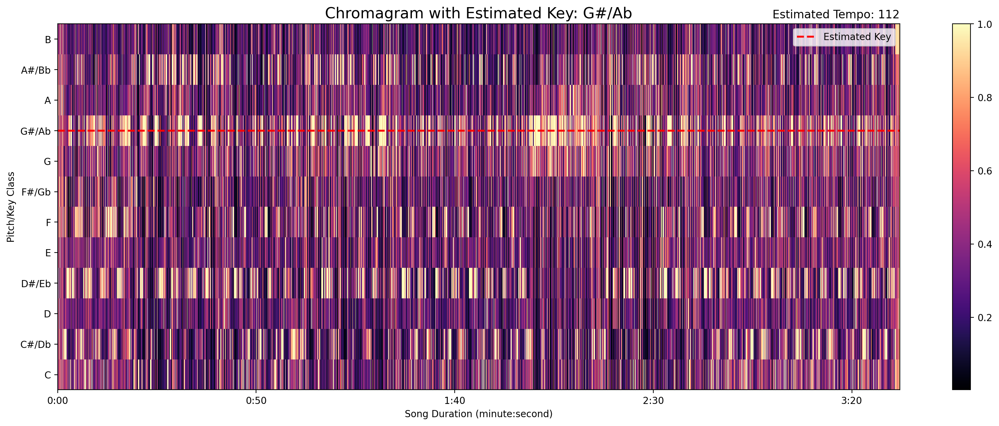

In [124]:
# Replace 'audio_path' with the path to your audio file
y, sr = librosa.load(audio_path_rickroll_full)

# Computes a chromagram from a waveform or power spectrogram.
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, n_chroma=12)

# Calculate the mean chroma feature for each chroma class
mean_chroma = np.mean(chromagram, axis=1)

# Find the index of the chroma class with the highest mean value
estimated_key_index = np.argmax(mean_chroma)

# Define chroma labels for 12 chroma classes
chroma_labels = ['C', 'C#/Db', 'D', 'D#/Eb', 'E', 'F', 'F#/Gb', 'G', 'G#/Ab', 'A', 'A#/Bb', 'B']

# Display the chromagram as a heatmap with custom y-axis labels
plt.figure(figsize=(20, 7))
librosa.display.specshow(chromagram, y_axis='chroma', x_axis='time')
plt.yticks(np.arange(12), chroma_labels)
plt.ylabel("Pitch/Key Class")
plt.xlabel("Song Duration (minute:second)")

# Plot the estimated key
plt.axhline(y=estimated_key_index, color='r', linestyle='--', linewidth=2, label='Estimated Key')
plt.colorbar()

# Set the main title with estimated key included
plt.title(f'Chromagram with Estimated Key: {chroma_labels[estimated_key_index]}', fontsize=16)

# Output of beat tracker is estimate of tempo in beats per minute (BPM) as well as an array of frame numbers for each beat event
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
# Add a subtitle that shows BPM
subtitle = f'Estimated Tempo: {tempo:.0f}'
plt.title(subtitle, fontsize=12, loc='right', color='black')

# Plot the legend and show plot 
plt.legend()
plt.show()

# Visualizing Audio Data

## Waveform
*Plots the amplitude envelope of a audio waveform*

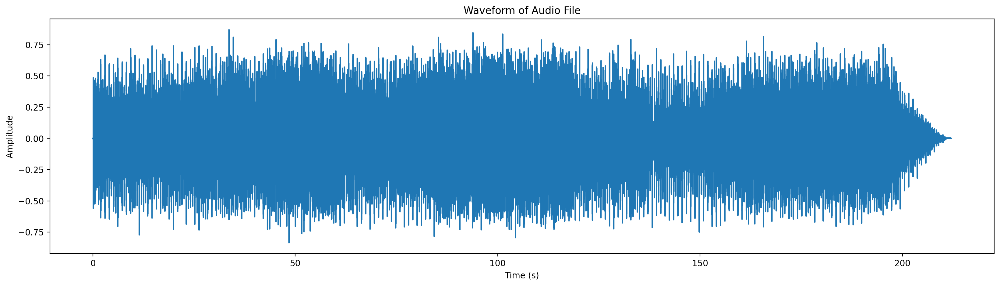

In [136]:
# Replace 'audio_path' with the path to your audio file
y, sr = librosa.load(audio_path_rickroll_full)

# Get the time values for the x-axis
time = np.arange(0, len(y)) / sr

# Plot the waveform
plt.figure(figsize=(20, 5))
plt.plot(time, y)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Audio File')
plt.show()

## Spectorgram
Represents the spectrum of frequencies
* *Plot Interpretation*:
  * X-axis: Time of audio clip
  * Y-axis: Range of frequencies (0 to 10kHz)

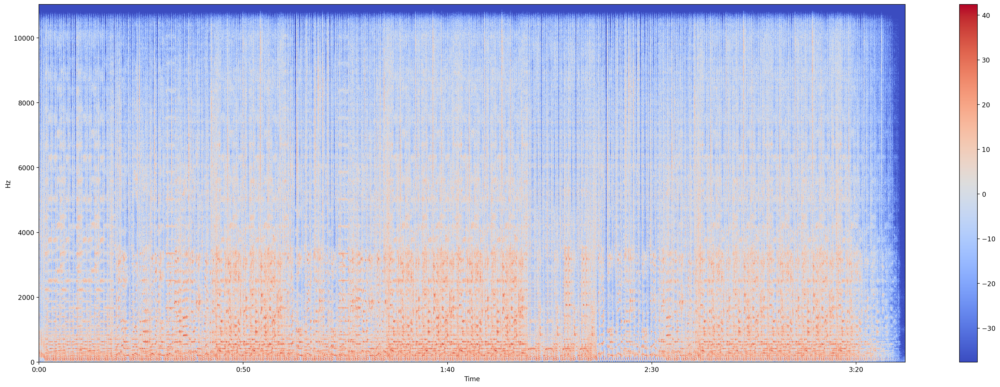

In [130]:
X = librosa.stft(y)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(30, 10))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

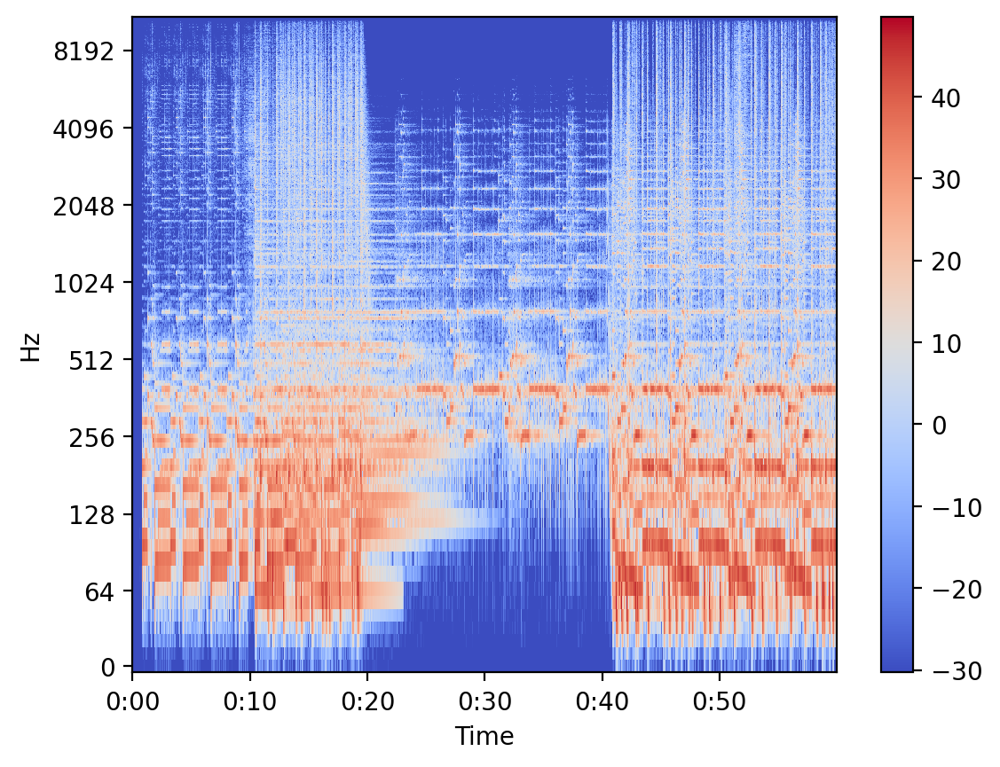

In [24]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()